In [1]:
#import warnings
#warnings.filterwarnings("default", category=FutureWarning)
#warnings.simplefilter(action='ignore', category=FutureWarning)


Загружаем данные


In [1]:
import pandas as pd                                                        #обработка и анализ данных
import numpy as np                                                         #общие математические и числовые операции
import copy                                                                #???
import seaborn as sns                                                      #создание статистических графиков
import matplotlib.pyplot as plt                                            #пакет для визуализации данных
from scipy import stats                                                    #Статистические функции
from sklearn import preprocessing                                          #машинное обучение; Предварительная обработка данных
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.neural_network import MLPRegressor
import tensorflow as tf                                                    #построение нейронных сетей 
from tensorflow import keras                                               #построение нейронных сетей 
from tensorflow.keras import layers
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn import metrics
from sklearn.metrics import mean_absolute_error
print(tf.__version__)

2.11.0


## Анализ датасета. Общая оценка содержимого


In [2]:
# файлы в папке программы
df1 = pd.read_excel('X_bp.xlsx') 
df2 = pd.read_excel('X_nup.xlsx')
# вывод размерностей
df1.shape,df2.shape 

((1023, 11), (1040, 4))

In [96]:
# объединяем датасеты методом inner
df = pd.merge(df1,df2)
# устраняем строки для которых не нашлось индекса (датасеты разнличной размерности)
df.dropna(inplace = True)
df.head()

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [97]:
#выводим размерность массива
df.shape,df.columns

((1023, 14),
 Index(['Unnamed: 0', 'Соотношение матрица-наполнитель', 'Плотность, кг/м3',
        'модуль упругости, ГПа', 'Количество отвердителя, м.%',
        'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
        'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
        'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
        'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
       dtype='object'))

In [5]:
#удаляем ненужный столбец "Unnamed"
df.drop('Unnamed: 0',axis = 1, inplace = True)
print(df.shape)
df.head(1)

(1023, 13)


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.0,22.267857,100.0,210.0,70.0,3000.0,220.0,0,4.0,57.0


Анализ таблицы


In [7]:
#общая информация о таблице
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

In [99]:
#категориальную характеристику 'Угол нашивки, град', закодируем при помощи LabelEncoder
le = preprocessing.LabelEncoder()
df['Угол нашивки, град'] = le.fit_transform(df['Угол нашивки, град'])


,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.0,57.0
1,1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.0,60.0
2,2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.0,70.0
3,3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.0,47.0
4,4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.0,57.0
5,5,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.0,60.0
6,6,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.0,70.0
7,7,2.561475,1900.000000,535.000000,111.860000,22.267857,284.615385,380.000000,75.000000,1800.000000,120.000000,0,7.0,47.0
8,8,3.557018,1930.000000,889.000000,129.000000,21.250000,300.000000,380.000000,75.000000,1800.000000,120.000000,0,7.0,57.0
9,9,3.532338,2100.000000,1421.000000,129.000000,21.250000,300.000000,1010.000000,78.000000,2000.000000,300.000000,0,7.0,60.0


Описательная статистика 



In [8]:
df.describe()

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


Подсчет уникальных значений по столбцам 

In [15]:
df.nunique()
# для просмотра наличия дубликатов df.duplicated().sum()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [ ]:
df.isna() # маска с пропущенными значениями 

In [17]:
df.isna().sum() # подсчет пропущенных значений 

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

## Разведочный Анализ (EDA)

Строим гистограммы

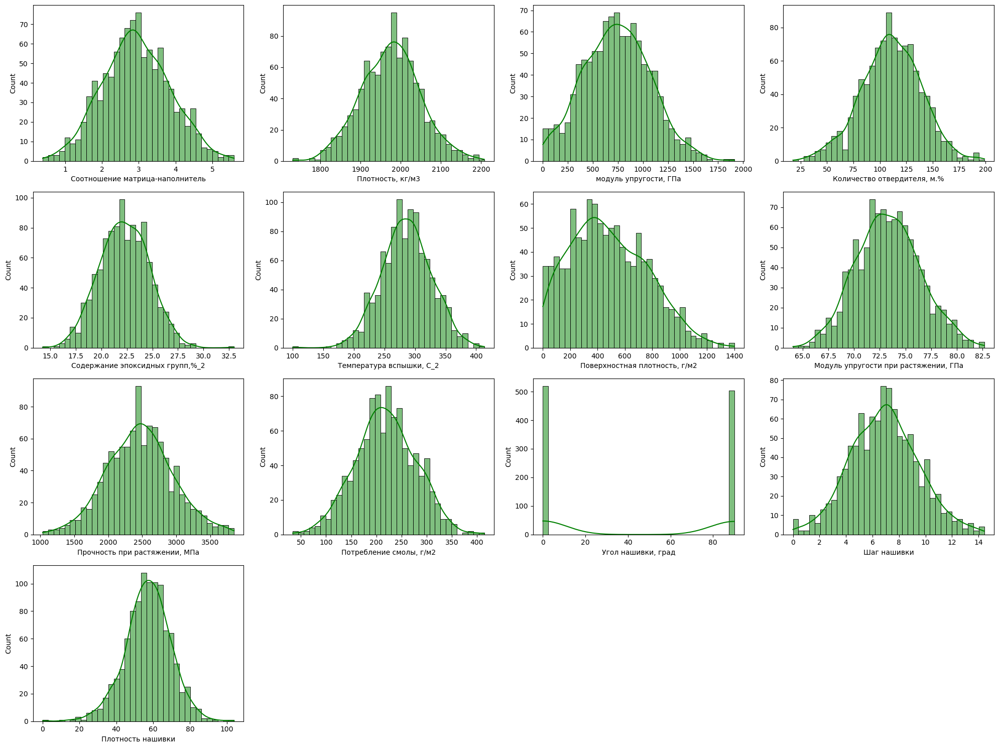

In [13]:
from matplotlib.colorbar import colorbar_factory
def histogram (df, n_rows, n_cols):
    fig=plt.figure(figsize=(20, 15))
    for i, column in enumerate(df.columns):
        ax=fig.add_subplot(n_rows,n_cols,i+1)
        sns.histplot(data=df, x=column,kde=True, bins=35, color = 'green')
    fig.tight_layout()
    plt.show()

histogram(df, 4, 4)

In [20]:
import plotly.express as px
for column in df.columns:
    fig = px.histogram(df, x=column, color_discrete_sequence=['blue'], nbins=100, marginal="box")
    fig.show()

Попарные графики рассеяния

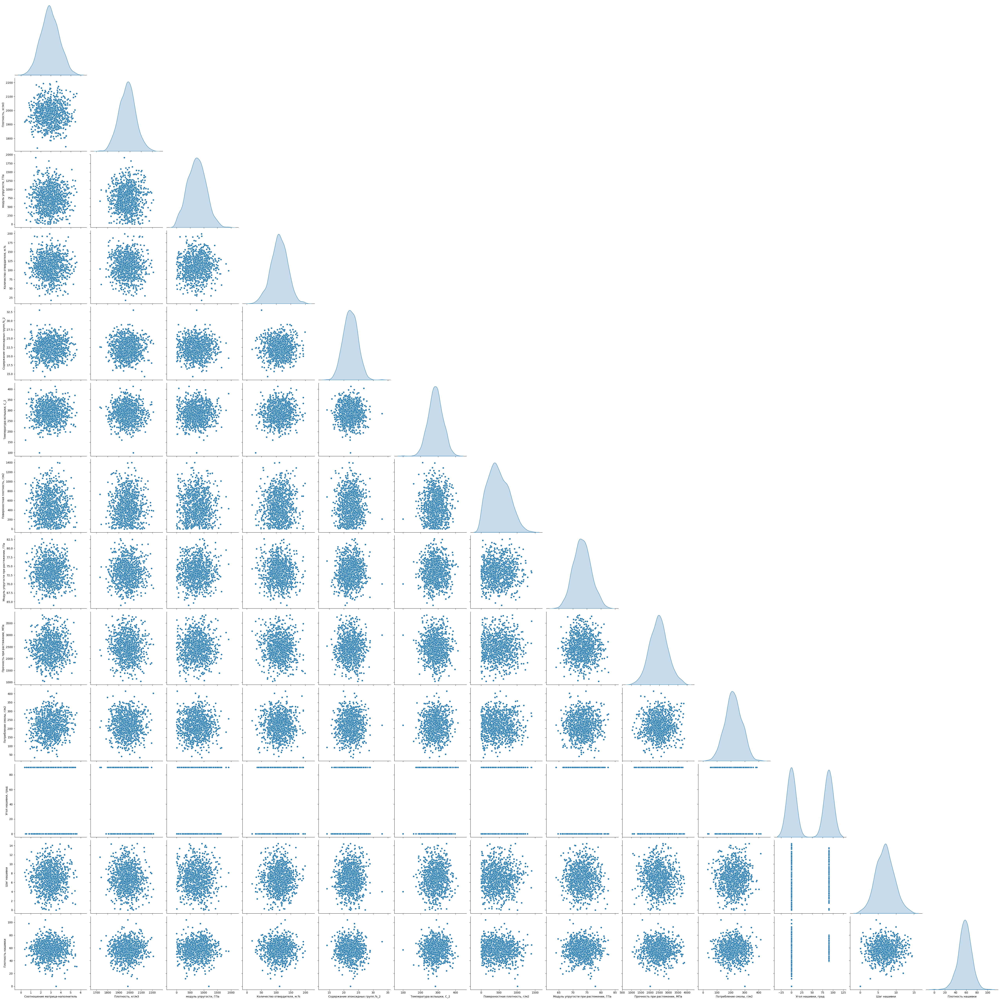

In [21]:
sns.pairplot(df, height=4, diag_kind='kde', corner = True);

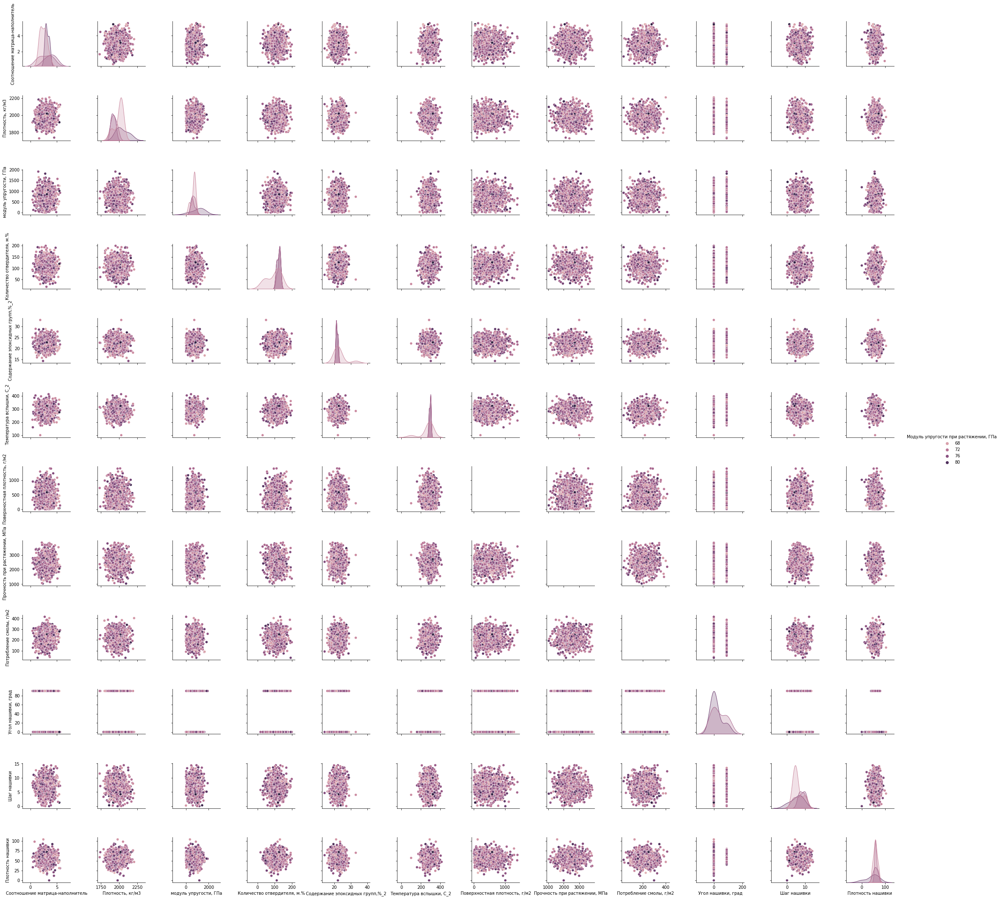

In [20]:
# дополнительные графики попарного рассеивания  в привязке к целевой переменной
sns.pairplot(df, hue="Модуль упругости при растяжении, ГПа")


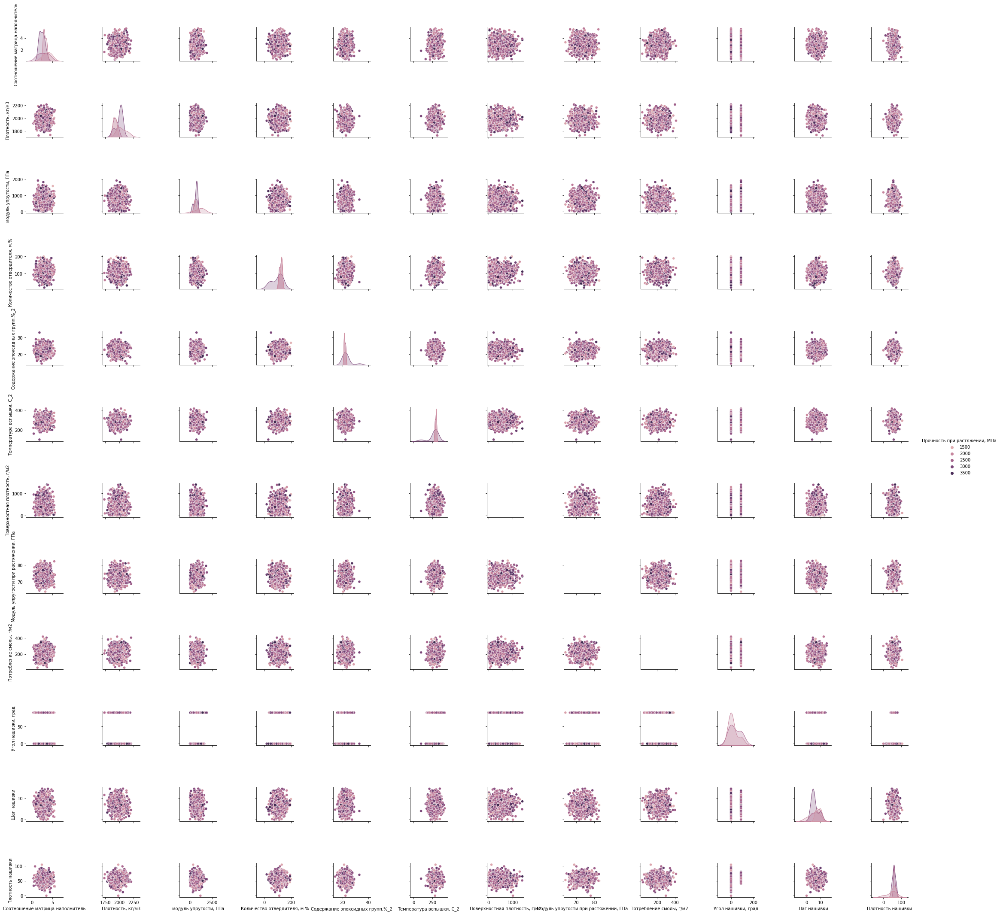

In [21]:
# дополнительные графики попарного рассеивания  в привязке к целевой переменной
sns.pairplot(df, hue="Прочность при растяжении, МПа")

Матрица корреляции

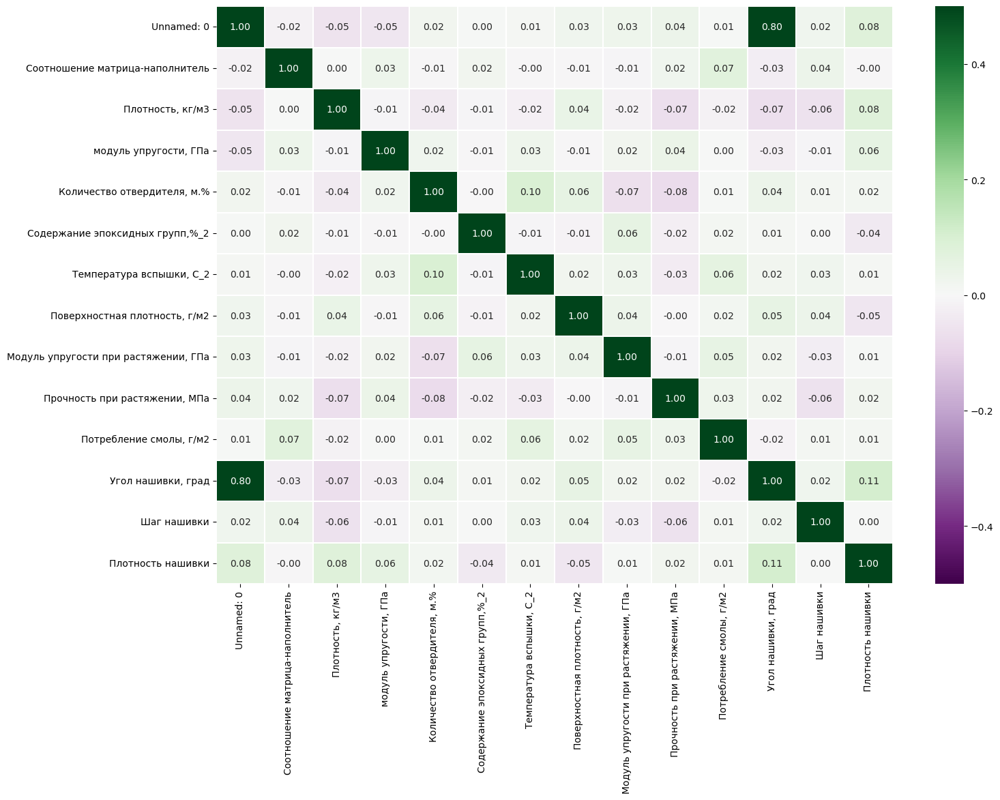

In [100]:
def get_corr(df):
  corr = df.corr()
  fig, ax = plt.subplots(figsize=(16, 11))
  sns.heatmap(corr, vmin=-0.5, vmax=0.5, annot=True, fmt='.2f',cmap='PRGn', ax=ax, linewidths = 0.1)
  plt.show()
get_corr(df)

Диаграмма "Ящик с усами" (Boxplot)

In [23]:
''' в данном случае блок мало информативен
def box_pl1(df):
  columns = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
          'модуль упругости, ГПа', 'Количество отвердителя, м.%',
          'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
          'Поверхностная плотность, г/м2', 
          'Потребление смолы, г/м2',
          'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']
  fig, axs = plt.subplots(ncols=12, figsize=(32,9))
  for i, column in enumerate(df[columns]):
    sns.boxplot(data=df, x=column, y='Модуль упругости при растяжении, ГПа', ax=axs[i])


  fig, axs = plt.subplots(ncols=12, figsize=(32,9))
  for i, column in enumerate(df[columns]):
    sns.boxplot(data=df, x=column, y='Прочность при растяжении, МПа', ax=axs[i])
box_pl1(df) '''

" в данном случае блок мало информативен\ndef box_pl1(df):\n  columns = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',\n          'модуль упругости, ГПа', 'Количество отвердителя, м.%',\n          'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',\n          'Поверхностная плотность, г/м2', \n          'Потребление смолы, г/м2',\n          'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']\n  fig, axs = plt.subplots(ncols=12, figsize=(32,9))\n  for i, column in enumerate(df[columns]):\n    sns.boxplot(data=df, x=column, y='Модуль упругости при растяжении, ГПа', ax=axs[i])\n\n\n  fig, axs = plt.subplots(ncols=12, figsize=(32,9))\n  for i, column in enumerate(df[columns]):\n    sns.boxplot(data=df, x=column, y='Прочность при растяжении, МПа', ax=axs[i])\nbox_pl1(df) "

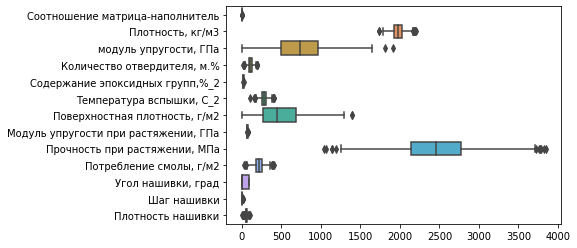

In [24]:
# box_plot на маленьком поле
def box_plt3(df):
  sns.boxplot(data = df, orient="h")
  plt.show()
box_plt3(df)

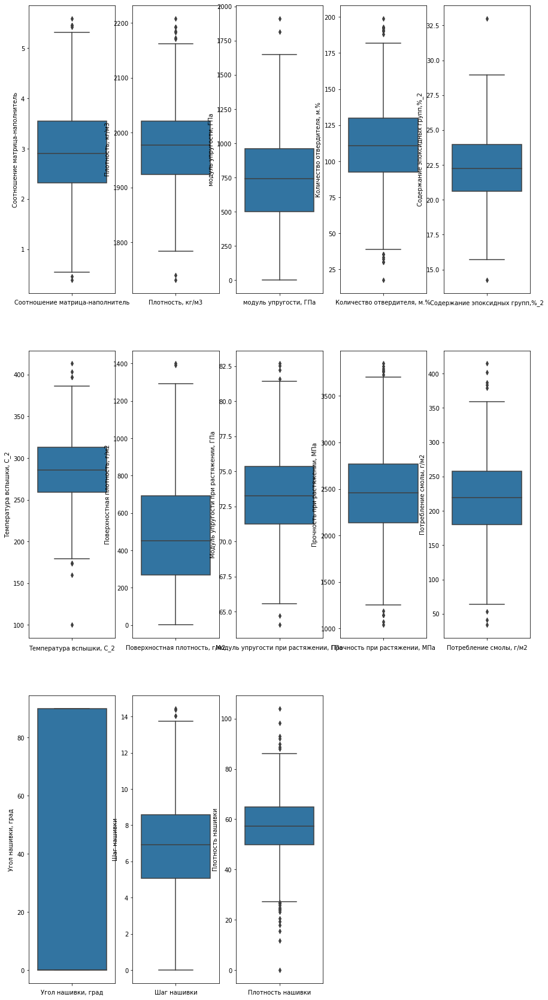

In [25]:
# box plot раздельный
def box_pl2(df):
  col = 5  # столбцы
  k = 1  # счетчик
  row = 3  # строки

  fig = plt.figure(figsize=(15, 30))

  for i in df.columns:
      plt.subplot(row, col, k)
      plt.xlabel(i)
      sns.boxplot(y = df[i])
      k+=1
    
  plt.show()
box_pl2(df)

Удаление выбросов методом межквартильных расстояний

In [101]:
for i in df.columns:
    q75, q25 = np.percentile(df.loc[:,i], [75,25])
    intr_qr = q75 - q25
    max = q75 + (1.5 * intr_qr)
    min = q25 - (1.5 * intr_qr)
    df.loc[df[i] < min, i] = np.nan
    df.loc[df[i] > max, i] = np.nan
df.dropna(inplace = True)

"Ящик с усами" после удаления выбросов

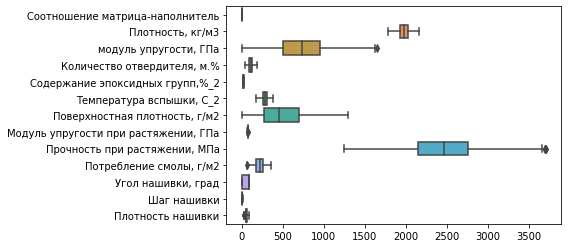

In [27]:
# box_pl2(df)
sns.boxplot(data = df, orient="h")
plt.show()

In [28]:
df.shape

(926, 13)

Оценка плотности ядра

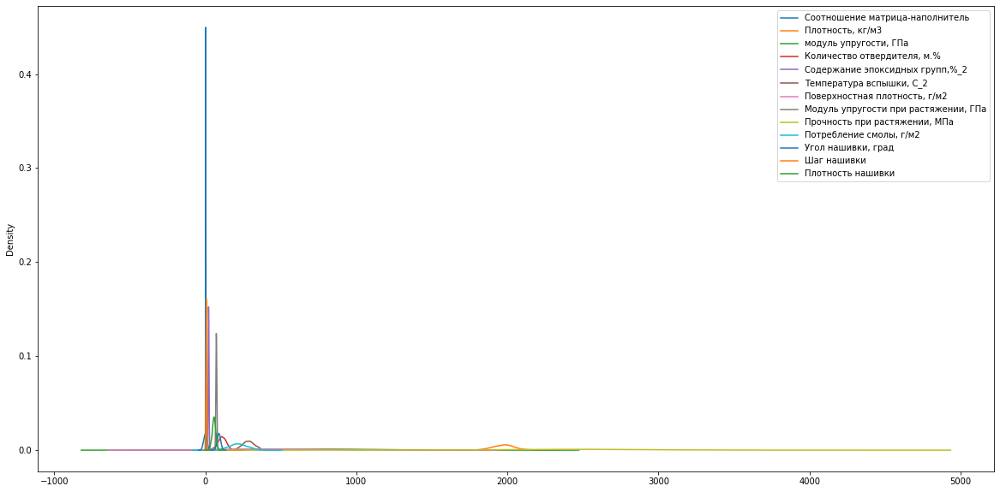

In [29]:
def plt_kde(df):
  fig, ax = plt.subplots(figsize=(20, 10))
  df.plot(kind='kde', ax=ax)
plt_kde(df)

Нормализуем

In [108]:
scaler = preprocessing.MinMaxScaler()
columns = df.columns
df_n = scaler.fit_transform(np.array(df))
df_n = pd.DataFrame(df_n, columns=columns)
df_n.drop('Unnamed: 0',axis = 1, inplace = True)
print(df_n.shape)

df_n.head()

(936, 13)


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.274768,0.651097,0.447061,0.079153,0.607435,0.509164,0.16223,0.280303,0.71259,0.529221,0.0,0.289334,0.557156
1,0.274768,0.651097,0.447061,0.630983,0.418887,0.583596,0.16223,0.280303,0.71259,0.529221,0.0,0.362355,0.335840
2,0.466552,0.651097,0.455721,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.0,0.362355,0.506083
3,0.465836,0.571539,0.452685,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.0,0.362355,0.557156
4,0.424236,0.332865,0.488508,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.0,0.362355,0.727399


In [110]:
df_n.describe() #описательная статистика после нормализации

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000
mean,0.498933,0.502695,0.446764,0.504664,0.491216,0.516059,0.373733,0.488647,0.495706,0.521141,0.511752,0.502232,0.513776
std,0.187489,0.187779,0.199583,0.188865,0.180620,0.190624,0.217078,0.191466,0.188915,0.195781,0.500129,0.183258,0.191342
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.372274,0.368517,0.301243,0.376190,0.367716,0.386128,0.205619,0.359024,0.365149,0.392067,0.000000,0.372211,0.390482
50%,0.494538,0.511229,0.447061,0.506040,0.489382,0.515980,0.354161,0.485754,0.491825,0.523766,1.000000,0.504258,0.516029
75%,0.629204,0.624999,0.580446,0.637978,0.623410,0.646450,0.538683,0.615077,0.612874,0.652447,1.000000,0.624604,0.638842
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [31]:
scaler.inverse_transform(np.array(df_n)[:1,:])

array([[1.85714286e+00, 2.03000000e+03, 7.38736842e+02, 5.00000000e+01,
        2.37500000e+01, 2.84615385e+02, 2.10000000e+02, 7.00000000e+01,
        3.00000000e+03, 2.20000000e+02, 0.00000000e+00, 4.00000000e+00,
        6.00000000e+01]])

Описательная статистика характеристик после нормализации

In [25]:
df_n.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,936.0,0.50,0.19,0.0,0.37,0.49,0.63,1.0
"Плотность, кг/м3",936.0,0.50,0.19,0.0,0.37,0.51,0.62,1.0
"модуль упругости, ГПа",936.0,0.45,0.20,0.0,0.30,0.45,0.58,1.0
"Количество отвердителя, м.%",936.0,0.50,0.19,0.0,0.38,0.51,0.64,1.0
"Содержание эпоксидных групп,%_2",936.0,0.49,0.18,0.0,0.37,0.49,0.62,1.0
"Температура вспышки, С_2",936.0,0.52,0.19,0.0,0.39,0.52,0.65,1.0
"Поверхностная плотность, г/м2",936.0,0.37,0.22,0.0,0.21,0.35,0.54,1.0
"Модуль упругости при растяжении, ГПа",936.0,0.49,0.19,0.0,0.36,0.49,0.62,1.0
"Прочность при растяжении, МПа",936.0,0.50,0.19,0.0,0.37,0.49,0.61,1.0
"Потребление смолы, г/м2",936.0,0.52,0.20,0.0,0.39,0.52,0.65,1.0


Оценим ящик с усами после нормализации

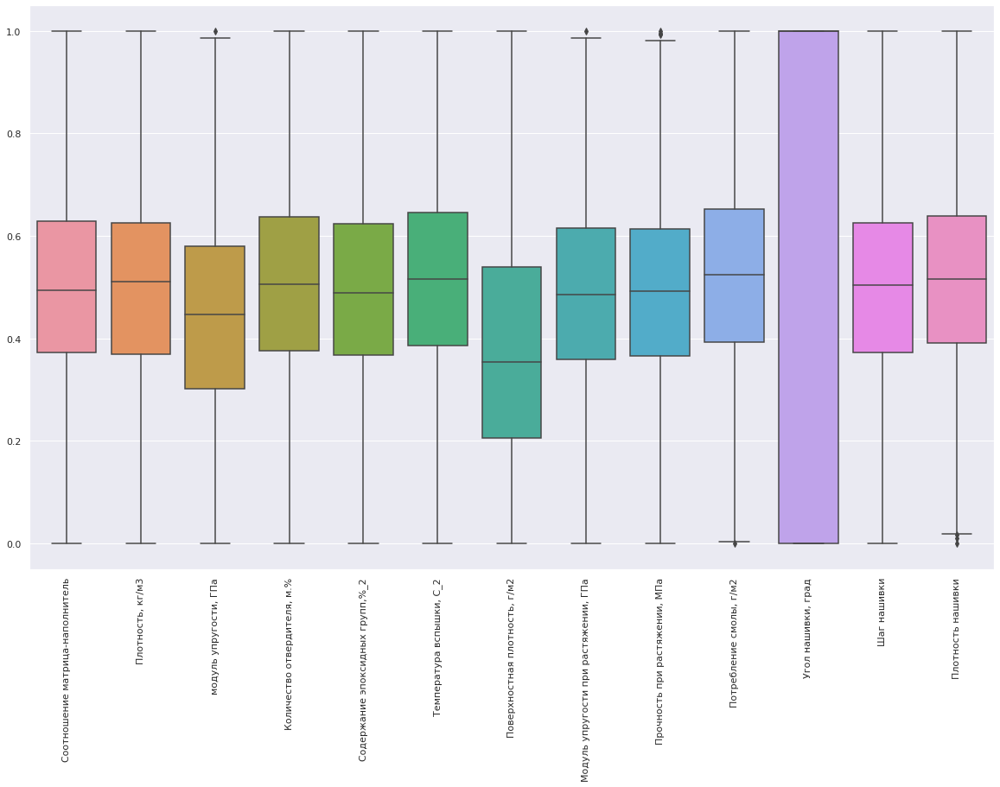

In [33]:
sns.set(rc={'figure.figsize':(20,12)})
ax = sns.boxplot(data=df_n)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

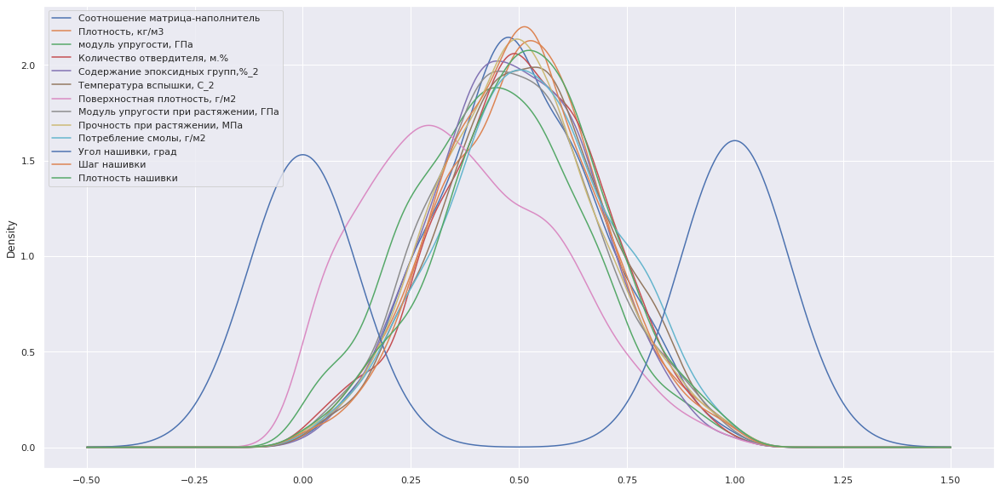

In [34]:
# распредление после нормализации
plt_kde(df_n)

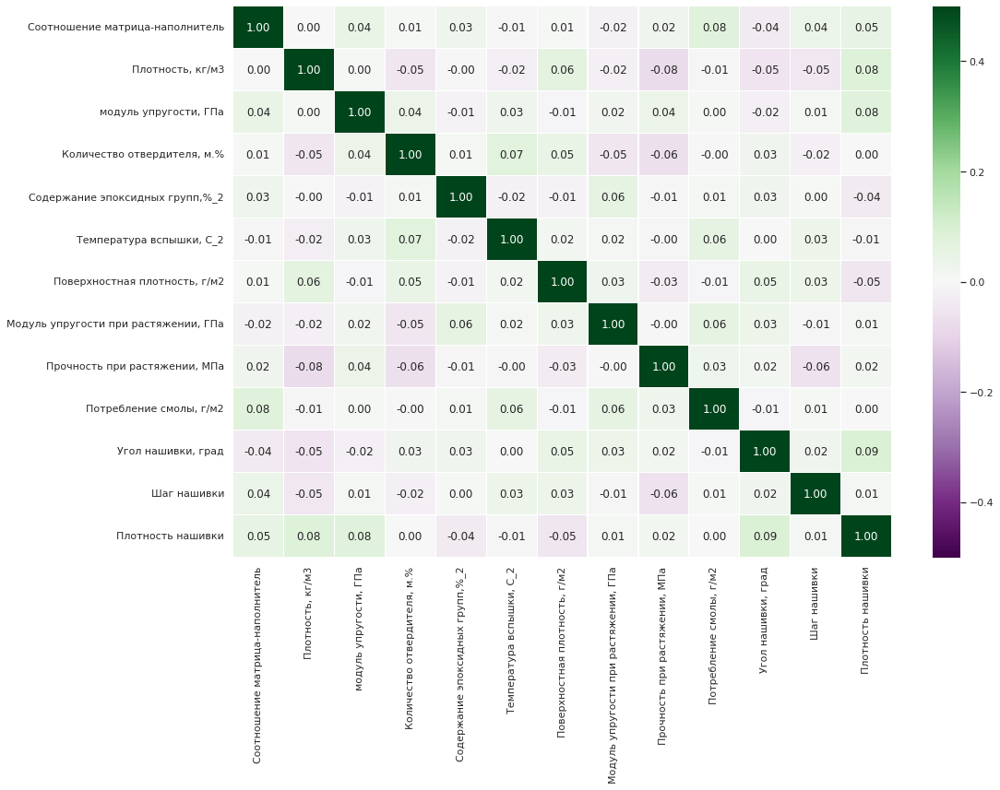

In [35]:
# Корреялция после нормализации
get_corr(df_n)

##Модели для прогноза модуля упругости при растяжении и прочности при растяжении.


In [59]:
#Визуализация предсказанных значений целевых переменных
def predicted_plot(y_test, y_pred, model_name):
  plt.figure(figsize=(15,9))
  plt.title(f'Тестовые и прогнозные значения, Модуль 1: {model_name}')
  plt.plot(y_test.to_numpy()[:,0], label='Тест')
  plt.plot(y_pred[:,0], label='Прогноз')
  plt.legend(loc='best')
  plt.ylabel('Модуль упругости при растяжении, ГПа')
  plt.xlabel('Порядок')

  plt.figure(figsize=(15,9))
  plt.title(f'Тестовые и прогнозные значения, Модуль 1: {model_name}')
  plt.plot(y_test.to_numpy()[:,1], label='Тест')
  plt.plot(y_pred[:,1], label='Прогноз')
  plt.legend(loc='best')
  plt.ylabel('Прочность при растяжении, МПа')
  plt.xlabel('Порядок')
# Для одной целевой переменной
def predicted_ns(y_test, y_pred):
  plt.figure(figsize=(15,9))
  plt.title(f'Тест и прогноз, Соотношение М-Н: ')
  plt.plot(y_test.to_numpy(), label='Тест')
  plt.plot(y_pred, label='Прогноз')
  plt.legend(loc='best')
  plt.ylabel('Соотношение матрица-наполнитель')
  plt.xlabel('Порядок')

Входы и выходы для моделей

In [60]:
# scaler_X = MinMaxScaler()
# scaler_y = MinMaxScaler() 
# y = scaler_y.fit_transform(df[y_label])
# X = scaler_X.fit_transform(df.drop(y_label, axis = 1))
y_label = ['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа']
y = df_n[y_label] 
X = df_n.drop(y_label, axis = 1)
y.shape,X.shape

((926, 2), (926, 11))

In [38]:
# scaler_y.inverse_transform(y)

Разделяем датасет на обучающую и тестовую выборки


In [61]:
model_list = [] # список в котором будем хранить лучше модели
X_train, X_test, y_train,y_test = train_test_split(X, y , test_size=0.3, random_state=42)


Итоговый датасет ошибок


In [51]:
loss_df = pd.DataFrame(columns=['target','model','MSE','R2'])


Линейная регрессия


In [52]:
X_train.dropna().shape, X_train.shape

((648, 11), (648, 11))

In [62]:
# модуль упругости при растяжении
del loss_df
loss_df = pd.DataFrame([])
model = LinearRegression()
model.fit(X_train,  y_train)
y_pred = model.predict(X_test)


model_name = 'Linear Regression'
def add_loss(loss_df, model_name):
  MSE = mean_squared_error(y_test, y_pred)
  R2 = r2_score(y_test, y_pred) #(коэффициент детерминации) функция оценки регрессии. Наилучшая возможная оценка — 1,0
  df = pd.DataFrame({'model':model_name,\
                                'target':['Модуль упругости и Прочность'],\
                                'MSE':MSE,\
                                'R2':R2})
  # print(df.head())
  loss_df = pd.concat([loss_df, df],ignore_index=True)
  return loss_df
loss_df = add_loss(loss_df, model_name)
# loss_df 'Linear Regression'

In [46]:
loss_df.head()

,model,target,MSE,R2
0,Linear Regression,Модуль упругости и Прочность,0.037525,0.001193


Визуализация

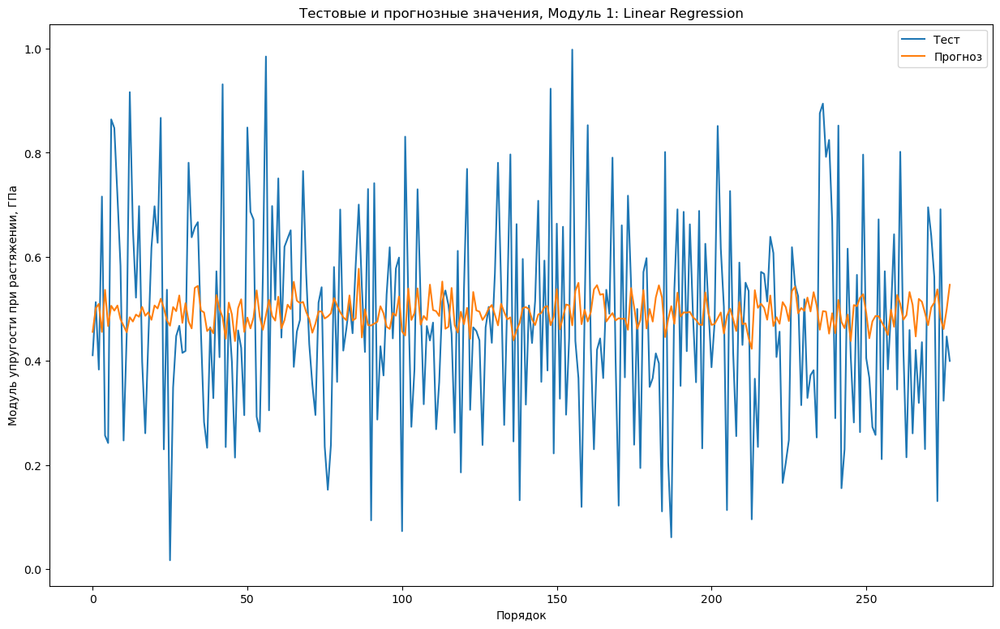

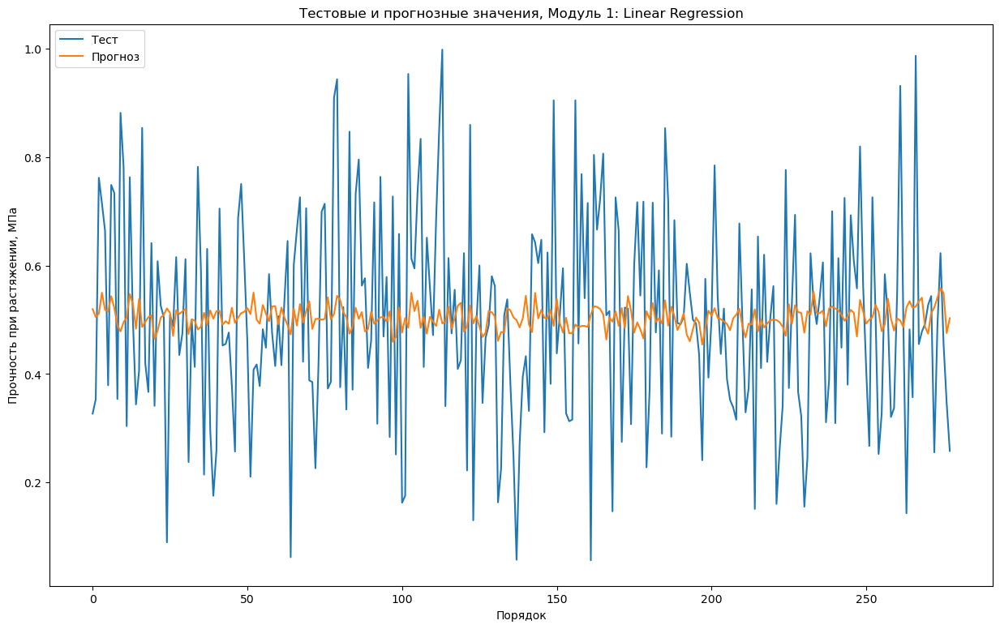

In [63]:
predicted_plot(y_test, y_pred, model_name)

Регрессия k-ближайших соседей


In [64]:

#model = KNeighborsRegressor(random_state = 42)
#random_seed(42)
model = KNeighborsRegressor()
grid = {'n_neighbors' : range(1, 101, 1), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }

gsc = GridSearchCV(model, grid, n_jobs=-1, cv=10,verbose = 1)
gsc.fit(X_train,  y_train)
model = gsc.best_estimator_
model.fit(X_train,  y_train)
y_pred = model.predict(X_test)
MSE = mean_squared_error(y_test,y_pred)
R2 = r2_score(y_test,y_pred)
model_name = 'KNeighborsRegressor'
model_list.append(model)
loss_df = add_loss(loss_df,model_name)
model

Fitting 10 folds for each of 800 candidates, totalling 8000 fits


KNeighborsRegressor(n_neighbors=100, weights='distance')

Визуализация

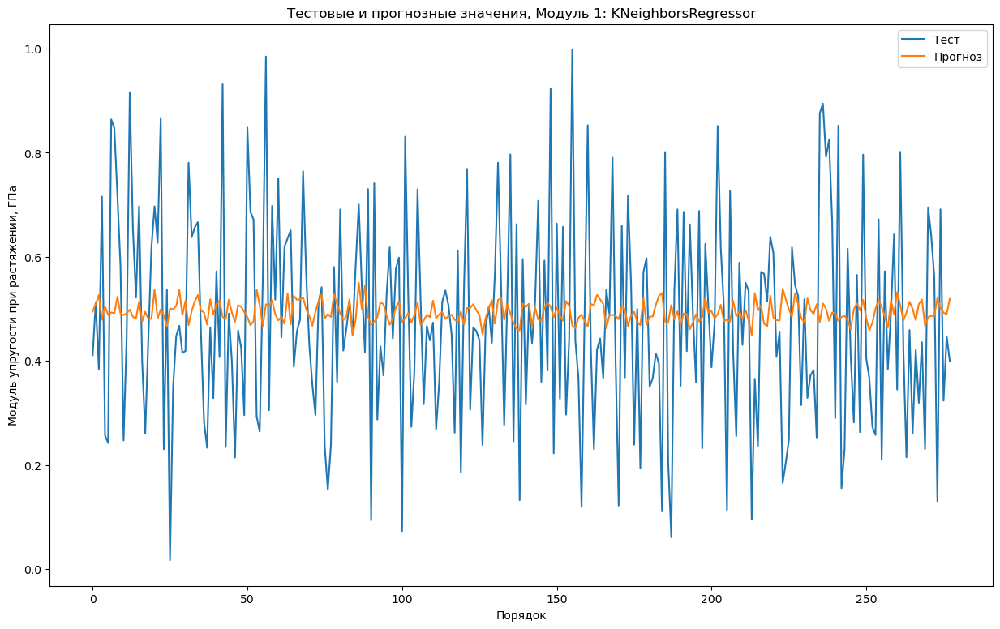

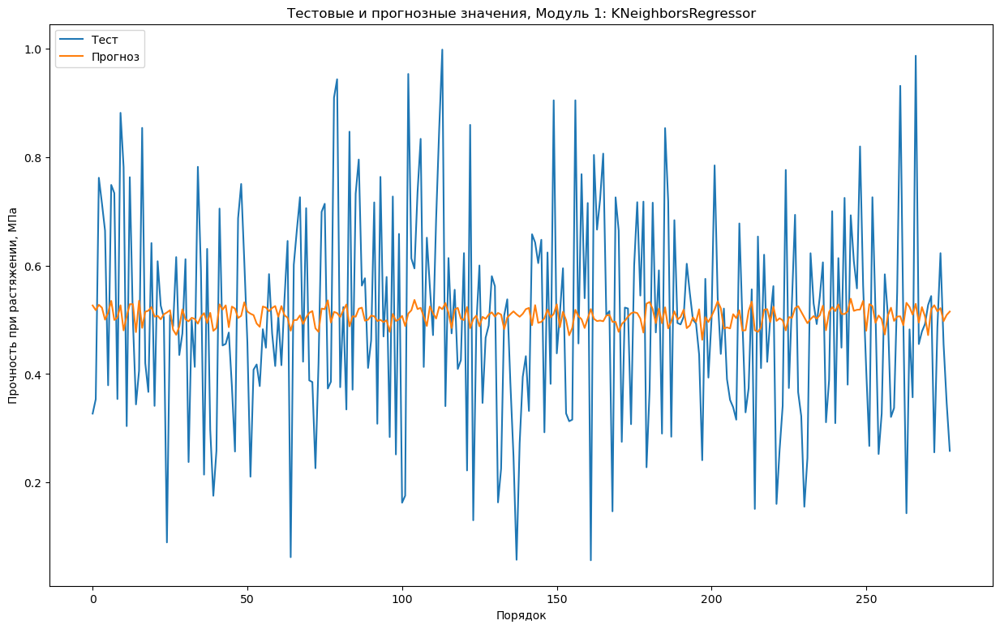

In [65]:
predicted_plot(y_test, y_pred,model_name)

In [47]:
loss_df.head()

,model,target,MSE,R2
0,Linear Regression,Модуль упругости и Прочность,0.035074,-0.024522
1,KNeighborsRegressor,Модуль упругости и Прочность,0.034788,-0.016102


SVR

MultiOutputRegressor(estimator=SVR(epsilon=0.5))

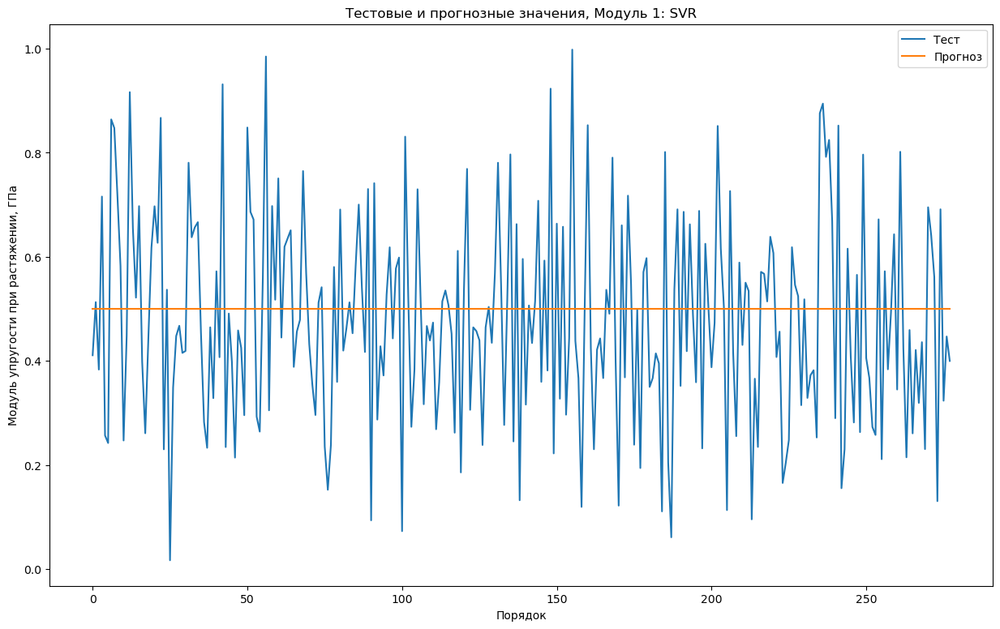

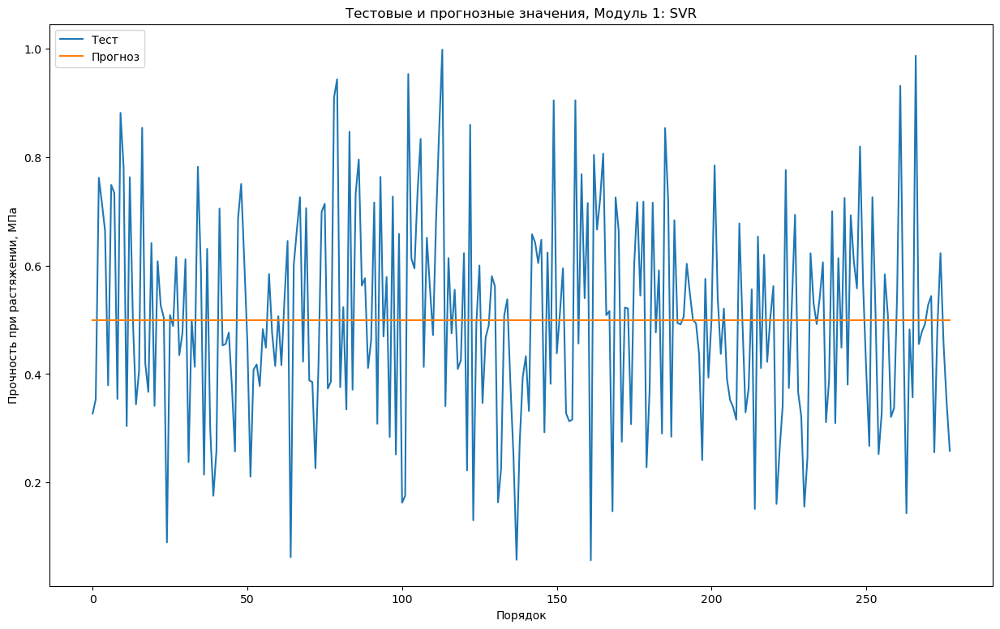

In [67]:
from sklearn.svm import SVR
from sklearn.multioutput import MultiOutputRegressor
grid = {
    'estimator__C':np.arange(1.0,5.5,0.5),
    'estimator__epsilon':np.arange(0.1,1.1,0.1)}

model = MultiOutputRegressor(SVR())
gsc = GridSearchCV(model, grid, n_jobs=-1, cv=10)
gsc.fit(X_train,  y_train)
model = gsc.best_estimator_
model.fit(X_train,  y_train)
y_pred = model.predict(X_test)
MSE = mean_squared_error(y_test,y_pred)
R2 = r2_score(y_test,y_pred)
model_name = 'SVR'
model_list.append(model)
loss_df = add_loss(loss_df,model_name)
predicted_plot(y_test, y_pred,model_name)
model

RandomForest

D:\Anaconda\lib\site-packages\sklearn\ensemble\_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

D:\Anaconda\lib\site-packages\sklearn\ensemble\_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



RandomForestRegressor(criterion='mse', max_depth=1, max_features='sqrt',
                      n_estimators=46, random_state=14)

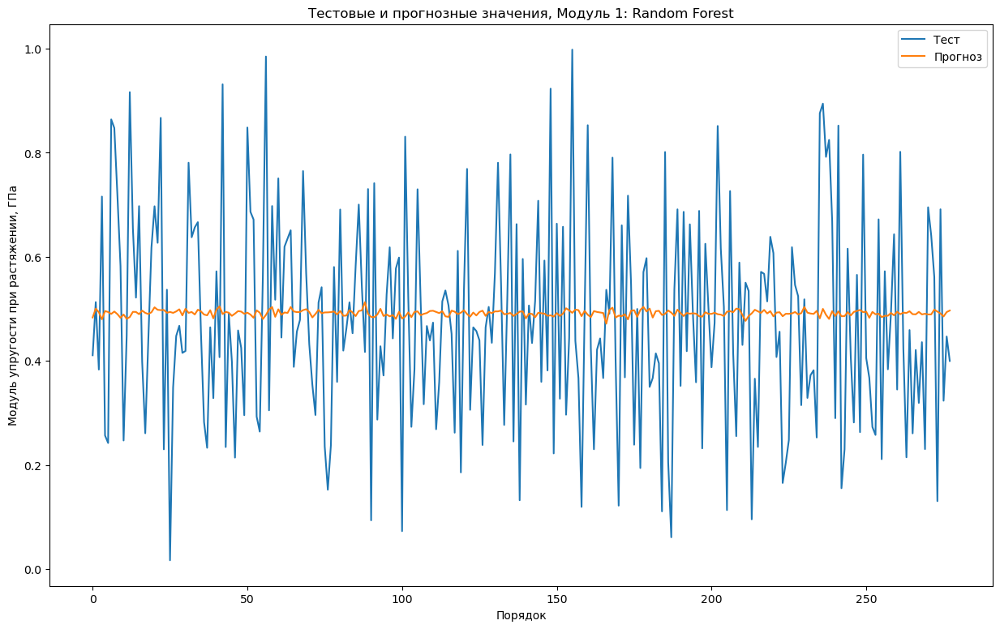

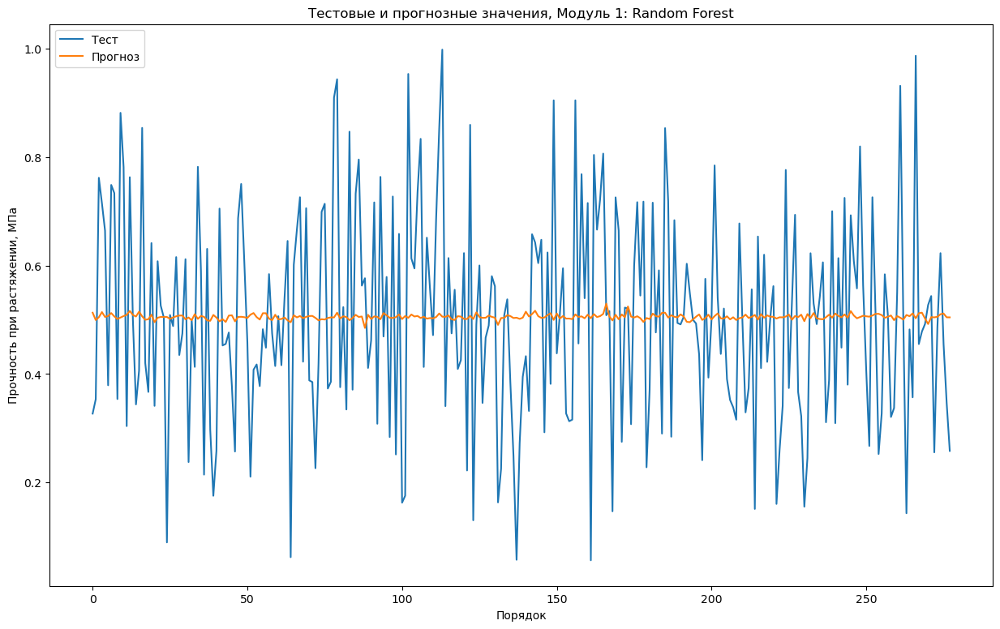

In [68]:
from sklearn.ensemble import RandomForestRegressor
# параметры для подстройки
model = RandomForestRegressor(random_state=14)
grid = {
    'n_estimators' : range(1, 100, 5),
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : range(1, 5, 1),
    'criterion':['mse']
}

# модель для оптимизации
gsc = MultiOutputRegressor(model)
gsc = GridSearchCV(model, grid, n_jobs=-1, cv=10)
gsc.fit(X_train,  y_train)
model = gsc.best_estimator_
model.fit(X_train,  y_train)
y_pred = model.predict(X_test)
MSE = mean_squared_error(y_test,y_pred)
R2 = r2_score(y_test,y_pred)
model_name = 'Random Forest'
model_list.append(model)
loss_df = add_loss(loss_df,model_name)
predicted_plot(y_test, y_pred,model_name)
model

In [69]:
loss_df

,model,target,MSE,R2
0,Linear Regression,Модуль упругости и Прочность,0.037525,0.001193
1,KNeighborsRegressor,Модуль упругости и Прочность,0.037575,-0.000125
2,SVR,Модуль упругости и Прочность,0.037808,-0.006424
3,Random Forest,Модуль упругости и Прочность,0.037577,-0.000320


Рекомендательная нейросеть для соотношения матрица-наполнитель


In [70]:
df.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [71]:
y = df_n['Соотношение матрица-наполнитель']
X = df_n.drop(['Соотношение матрица-наполнитель'], axis = 1)

X_train, X_test, y_train,y_test = train_test_split(X, y , test_size=0.3, random_state=42)
y.shape,X.shape

((926,), (926, 12))

In [72]:
from keras.engine.sequential import Sequential
from keras import layers
from keras import models
def plot_loss(history):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim([0, 1])
    plt.xlabel('Эпоха')

    plt.ylabel('MAE [MPG]')
    plt.legend()
    plt.grid(True)
model = Sequential()
model.add(layers.Dense(50, input_dim=X.shape[1], activation='relu'))
model.add(layers.Dropout(0.12))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.12))
model.add(layers.Dense(19, activation='relu'))
model.add(layers.Dropout(0.12))
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dropout(0.12))
model.add(layers.Dense(32, activation='softmax'))
model.add(layers.Dense(1))



In [73]:
model.summary()
dfmodel = model.compile(optimizer='adam', loss='mae', metrics=['mae'])
history = model.fit(
    X_train,
    y_train,
    validation_split=0.2,
    verbose=1, epochs=60)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 50)                650       
                                                                 
 dropout (Dropout)           (None, 50)                0         
                                                                 
 dense_1 (Dense)             (None, 128)               6528      
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_2 (Dense)             (None, 19)                2451      
                                                                 
 dropout_2 (Dropout)         (None, 19)                0         
                                                                 
 dense_3 (Dense)             (None, 64)                1

Epoch 50/60
17/17 [==============================] - 0s 19ms/step - loss: 0.1480 - mae: 0.1480 - val_loss: 0.1600 - val_mae: 0.1600
Epoch 51/60
17/17 [==============================] - 0s 7ms/step - loss: 0.1483 - mae: 0.1483 - val_loss: 0.1597 - val_mae: 0.1597
Epoch 52/60
17/17 [==============================] - 0s 14ms/step - loss: 0.1475 - mae: 0.1475 - val_loss: 0.1593 - val_mae: 0.1593
Epoch 53/60
17/17 [==============================] - 0s 15ms/step - loss: 0.1488 - mae: 0.1488 - val_loss: 0.1600 - val_mae: 0.1600
Epoch 54/60
17/17 [==============================] - 0s 11ms/step - loss: 0.1488 - mae: 0.1488 - val_loss: 0.1604 - val_mae: 0.1604
Epoch 55/60
17/17 [==============================] - 0s 17ms/step - loss: 0.1484 - mae: 0.1484 - val_loss: 0.1597 - val_mae: 0.1597
Epoch 56/60
17/17 [==============================] - 0s 17ms/step - loss: 0.1482 - mae: 0.1482 - val_loss: 0.1589 - val_mae: 0.1589
Epoch 57/60
17/17 [==============================] - 0s 29ms/step - loss: 0.1

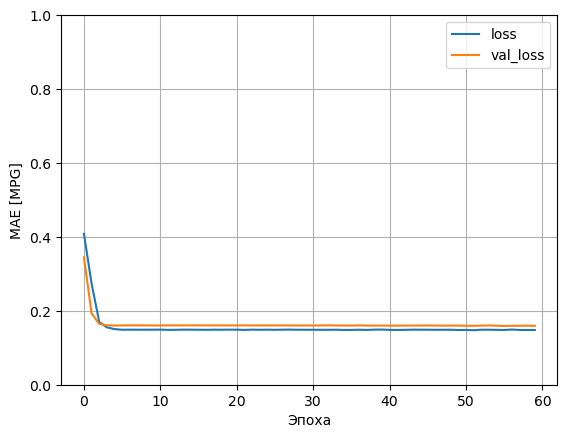

In [74]:
plot_loss(history)

Визуализация


9/9 [==============================] - 0s 10ms/step


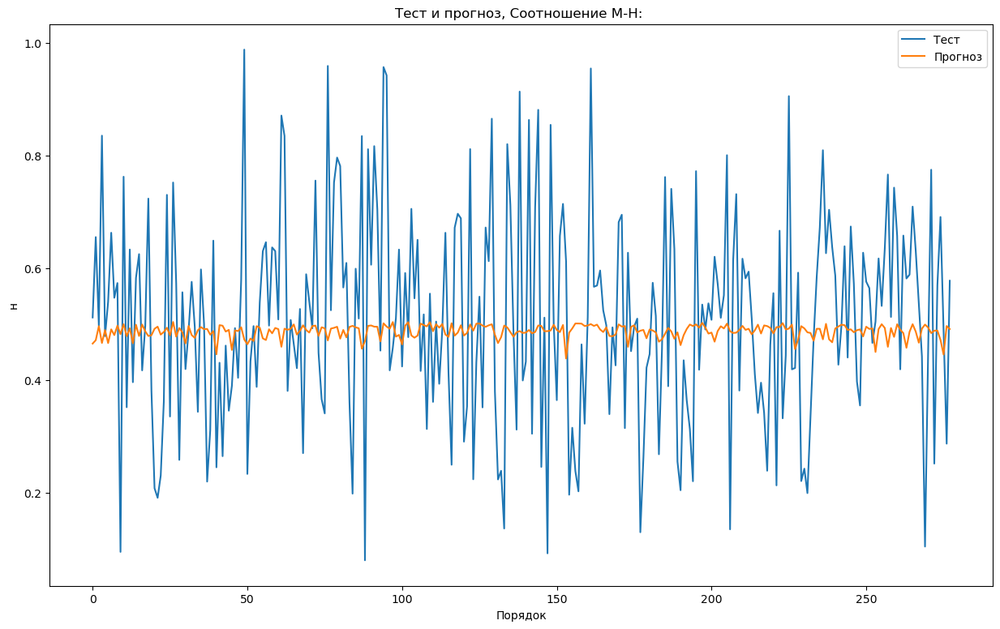

In [76]:
predicted_ns(y_test, model.predict(X_test))

Оценка MSE


In [77]:
model.evaluate(X_test, y_test, verbose=1)

9/9 [==============================] - 0s 3ms/step - loss: 0.1501 - mae: 0.1501


[0.15006330609321594, 0.15006330609321594]

Датасет с ошибками модели


In [78]:
MSE = mean_squared_error(y_test, model.predict(X_test.values))
R2 = r2_score(y_test, model.predict(X_test.values))

print(f'MSE NN = {MSE}')
print(f'R2_score NN = {R2}')

9/9 [==============================] - 0s 10ms/step
MSE NN = 0.035404264602766466
R2_score NN = -0.02286373921776197


In [79]:
loss_df

,model,target,MSE,R2
0,Linear Regression,Модуль упругости и Прочность,0.037525,0.001193
1,KNeighborsRegressor,Модуль упругости и Прочность,0.037575,-0.000125
2,SVR,Модуль упругости и Прочность,0.037808,-0.006424
3,Random Forest,Модуль упругости и Прочность,0.037577,-0.000320


In [80]:
for model in model_list:
  print(model)

KNeighborsRegressor(n_neighbors=100, weights='distance')
MultiOutputRegressor(estimator=SVR(epsilon=0.5))
RandomForestRegressor(criterion='mse', max_depth=1, max_features='sqrt',
                      n_estimators=46, random_state=14)


Для сохранения выбираем лучшую модель



In [81]:
model = model_list[2]
from joblib import dump, load

dump(model, 'filename.joblib')

['filename.joblib']

In [82]:
model_l = load('filename.joblib') 

In [83]:
model_l

RandomForestRegressor(criterion='mse', max_depth=1, max_features='sqrt',
                      n_estimators=46, random_state=14)

In [85]:
dump(scaler, 'scaler.joblib')

['scaler.joblib']

In [86]:
scaler_l = load('scaler.joblib')
scaler_l

MinMaxScaler()

Приложение

In [87]:
from joblib import dump, load
def input_variable():

  x1 = float(input('Введите значение переменной Соотношение матрица-наполнитель: '))
  x2 = float(input('Введите значение переменной Плотность: '))
  x3 = float(input('Введите значение переменной Модуль упругости: '))
  x4 = float(input('Введите значение переменной Количество отвердителя: '))
  x5 = float(input('Введите значение переменной Содержание эпоксидных групп: '))
  x6 = float(input('Введите значение переменной Температура вспышки: '))
  x7 = float(input('Введите значение переменной Модуль упругости при растяжении: '))
  x8 = float(input('Введите значение переменной Потребление смолы: '))
  x9 = float(input('Введите значение переменной Угол нашивки: '))
  x10 = float(input('Введите значение переменной Шаг нашивки: '))
  x11 = float(input('Введите значение переменной Плотность нашивки: '))
  return x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11

def input_proc(X):
  print('вызов модели')
  X = list(X)
  X.append(1)
  X.append(1)
  res = model_l.predict(scaler_l.transform(np.array(X).reshape(1,-1))[:,:11])
  print(res)
  return res 

def app_model():

  model_l = load('filename.joblib') 
  scaler_l = load('scaler.joblib')
  print('Приложение прогнозирует значения модулей упругости и растяжения')
  y_out = [1,1,1,1,1,1,1,1,1,1,1]
  for i in range(110):
    try:
      print('введите 1 для прогноза, 2 для выхода')
      check = input()
      
      if check == '1':
        print('Введите данные')
        r =input_proc(input_variable())
        y_out.append(r[0][0])
        y_out.append(r[0][1])
        res = scaler_l.inverse_transform(np.array(y_out).reshape(1,-1))[:,11:]
        print(res)
      elif check == '2':
        break
      else:
        print('Повторите выбор')
    except:
      print('Неверные данные. Повторите операцию')
app_model()

Приложение прогнозирует значения модулей упругости и растяжения
введите 1 для прогноза, 2 для выхода
1
Введите данные
Введите значение переменной Соотношение матрица-наполнитель: 546
Введите значение переменной Плотность: 465
Введите значение переменной Модуль упругости: 4654
Введите значение переменной Количество отвердителя: 65
Введите значение переменной Содержание эпоксидных групп: 54
Введите значение переменной Температура вспышки: 300
Введите значение переменной Модуль упругости при растяжении: 5
Введите значение переменной Потребление смолы: 645
Введите значение переменной Угол нашивки: 8
Введите значение переменной Шаг нашивки: 564
Введите значение переменной Плотность нашивки: 4654


D:\Anaconda\lib\site-packages\sklearn\base.py:450: UserWarning:

X does not have valid feature names, but RandomForestRegressor was fitted with feature names



вызов модели
[[0.49045477 0.51303708]]
[[ 6.75430205 57.94877841]]
введите 1 для прогноза, 2 для выхода
2
